In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from _FigureJiazeHelper import *
from _DetectabilityWithMeta import *
from _CommunityDetect import *
from EXPERIMENT import *

%load_ext autoreload
%autoreload 2

In [2]:
# Matplotlib settings

# plt.style.use('seaborn-whitegrid')
plt.rc('figure', figsize=(8, 5))
plt.rc('font', size=16)
plt.rc('font', family='sans-serif')
plt.rcParams['font.sans-serif'] = 'verdana'
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = basic_line_color
plt.rcParams['xtick.color'] = basic_line_color
plt.rcParams['ytick.color'] = basic_line_color
plt.rcParams['axes.labelsize'] = 20  # 'large'
plt.rcParams['lines.markersize'] = 12

# %matplotlib notebook
%config InlineBackend.figure_format = 'retina'

In [3]:
def edge_ami_snr(plot_rhos, plot_zs, ami, snr, ax=None):
    _rhos = np.sort(np.unique(plot_rhos))
    edge_ami_pos = np.zeros(np.shape(_rhos))
    edge_snr_pos = np.zeros(np.shape(_rhos))
    edge_ami_neg = np.zeros(np.shape(_rhos))
    edge_snr_neg = np.zeros(np.shape(_rhos))
    _deltas = np.sort(np.unique(plot_zs))
    i = 0
    for rho in _rhos:
        index = np.where(plot_rhos == rho)
        deltas = plot_zs[index]
        sort_index = np.argsort(deltas)
        deltas = deltas[sort_index]
        amis = np.around(ami[index], 3)[sort_index]
        snrs = snr[index][sort_index]
        deltas_pos = deltas[np.where(deltas > 0)]
        deltas_neg = deltas[np.where(deltas < 0)]
        amis_pos = amis[np.where(deltas > 0)]
        amis_neg = amis[np.where(deltas < 0)]
        snr_pos = snrs[np.where(deltas > 0)]
        snr_neg = snrs[np.where(deltas < 0)]
#         print(deltas_pos[np.where(amis_pos == np.min(amis_pos[np.where(amis_pos > 0)]))[0][0]])
        edge_ami_pos[i] = deltas_pos[np.where(amis_pos == np.min(amis_pos[np.where(amis_pos > 0)]))[0][0]]
        if np.size(np.where(amis_neg > 0)) > 0:
            edge_ami_neg[i] = deltas_neg[np.where(amis_neg == np.min(amis_neg[np.where(amis_neg > 0)]))[0][0]]
        else:
            edge_ami_neg[i] = np.min(deltas_neg)
        edge_snr_pos[i] = deltas_pos[np.where(snr_pos == np.min(snr_pos[np.where(snr_pos > 1)]))]
        if np.size(np.where(snr_neg > 1)) > 0:
            edge_snr_neg[i] = deltas_neg[np.where(snr_neg == np.min(snr_neg[np.where(snr_neg > 1)]))]
        else:
            edge_snr_neg[i] = np.min(deltas_neg)
        i += 1
    rhos = np.arange(0, np.size(_rhos))
    edge_ami_pos = np.array([np.where(_deltas == edge_ami_pos[i])[0] for i in rhos])
    edge_ami_neg = np.array([np.where(_deltas == edge_ami_neg[i])[0] for i in rhos])
    edge_snr_pos = np.array([np.where(_deltas == edge_snr_pos[i])[0] for i in rhos])
    edge_snr_neg = np.array([np.where(_deltas == edge_snr_neg[i])[0] for i in rhos])
    ax.plot(rhos, edge_ami_pos, label="AMI > 0 for assortative")
    plt.plot(rhos, edge_ami_neg, label="AMI > 0 for disassortative")
    plt.plot(rhos, edge_snr_pos, label="SNR > 1 for assortative")
    plt.plot(rhos, edge_snr_neg, label="SNR > 1 for disassortative")
    plt.legend(loc=2, bbox_to_anchor=(1.15, 1.0), fontsize=10, markerscale=2)

# average degree = 50

min=-1.4000000000000001e-05, max=1.0
min delta=-0.005, max delta=0.025
[-0.005  -0.0045 -0.004  -0.0035 -0.003  -0.0025 -0.002  -0.0015 -0.001
 -0.0005  0.0005  0.001   0.0015  0.002   0.0025  0.003   0.0035  0.004
  0.0045  0.005   0.0055  0.006   0.0065  0.007   0.0075  0.008   0.0085
  0.009   0.0095  0.01    0.0105  0.011   0.0115  0.012   0.0125  0.013
  0.0135  0.014   0.0145  0.015   0.0155  0.016   0.0165  0.017   0.0175
  0.018   0.0185  0.019   0.0195  0.02    0.0205  0.021   0.0215  0.022
  0.0225  0.023   0.0235  0.024   0.0245  0.025 ]
min=-1.4000000000000001e-05, max=1.0
-0.005, 0.025
min=-4.9e-05, max=1.0
-0.005, 0.025
min=-0.7117479999999999, max=0.6113330000000001
-0.005, 0.025
min=0.019999999999999997, max=50.0
-0.005, 0.025
min=0.009999999999999998, max=50.0
-0.005, 0.025
min=-25.0, max=4.508399999999998
-0.005, 0.025
min=1.0, max=6.1
-0.005, 0.025
min=1.0, max=6.1
-0.005, 0.025


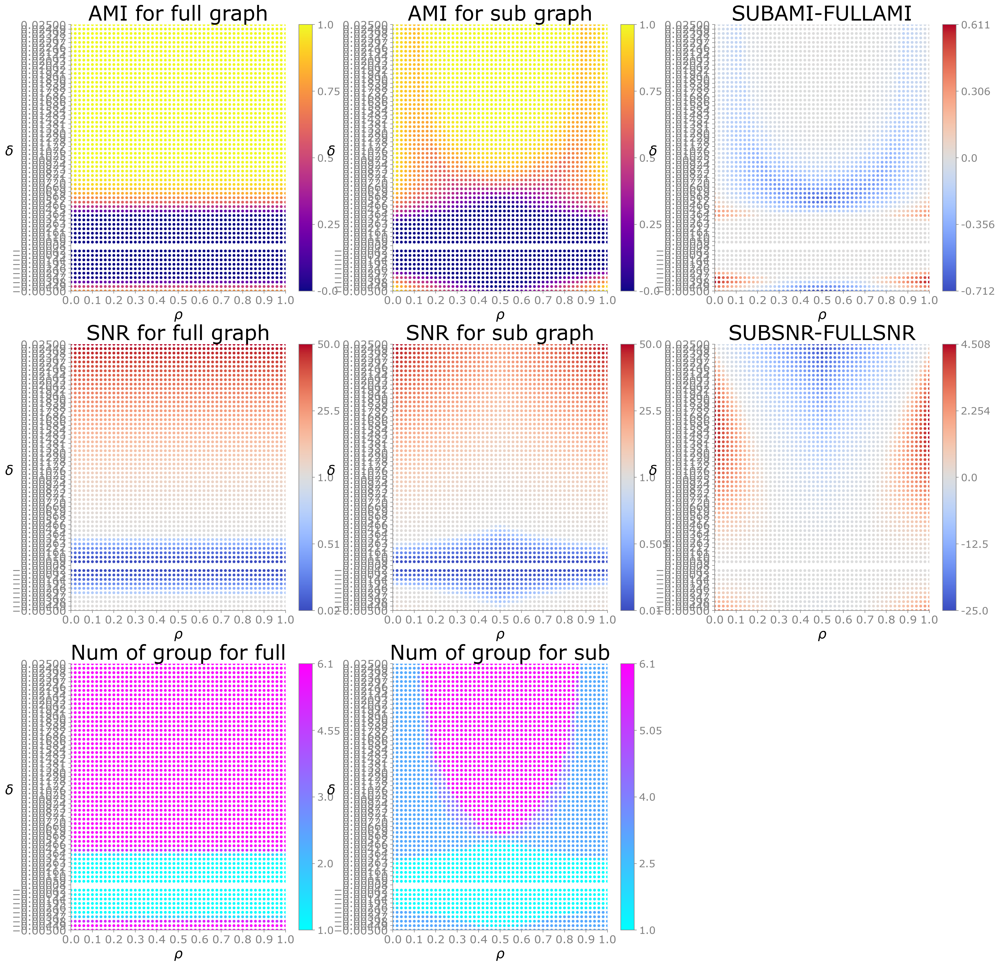

In [21]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = True
fileId = 'amiExp5.17' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, full_ami_givenNumGroup, sub_ami_givenNumGroup, full_num_groups_given, sub_num_groups_given = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=True)
print(f'min={np.min(full_ami)}, max={np.max(full_ami)}')
print(f'min delta={np.min(plot_zs)}, max delta={np.max(plot_zs)}')
# save_path = "./_Figure/AMI_fullgraph_d_" + str(d) + ".png"
print(np.unique(plot_zs))
save_path = None
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)
# save_path = "./_Figure/" + fileId + "noGivenNumGroup.png"
# plt.tight_layout()
# plt.savefig(save_path, dpi=600)

n=12000, group=6, d=50, rho=0.1, min delta=-0.005, max delta=0.025
[[2.  ]
 [1.62]
 [1.28]
 [0.98]
 [0.72]
 [0.5 ]
 [0.32]
 [0.18]
 [0.08]
 [0.02]
 [0.02]
 [0.08]
 [0.18]
 [0.32]
 [0.5 ]
 [0.72]
 [0.98]
 [1.28]
 [1.62]
 [2.  ]
 [2.42]
 [2.88]
 [3.38]
 [3.92]
 [4.5 ]
 [5.12]
 [5.78]
 [6.48]
 [7.22]
 [8.  ]]


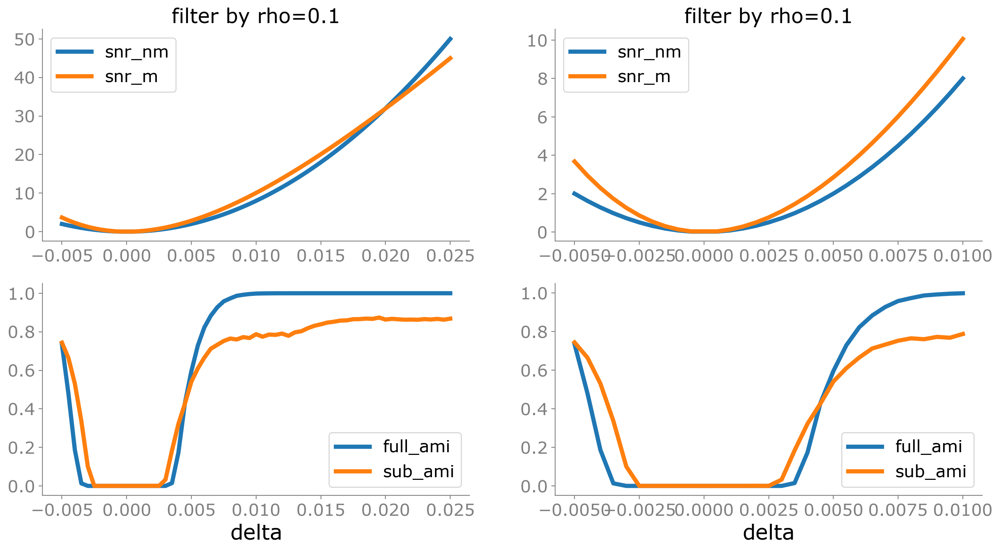

In [9]:
rho = 0.1
filter_by_rho(rho, plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m)

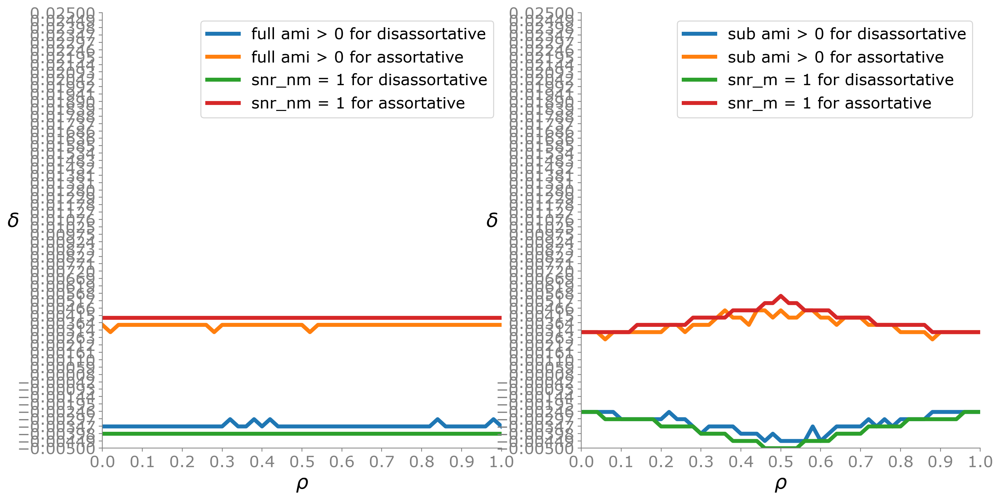

In [14]:
edge_ami_snr(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m)

min=-0.00010500000000000002, max=1.0
-0.005, 0.025
min=-0.000282, max=1.0
-0.005, 0.025
min=-0.6972349999999999, max=0.597539
-0.005, 0.025
min=0.019999999999999997, max=50.0
-0.005, 0.025
min=0.009999999999999998, max=50.0
-0.005, 0.025
min=-25.0, max=4.508399999999998
-0.005, 0.025
min=6.0, max=6.0
-0.005, 0.025
min=3.0, max=6.0
-0.005, 0.025


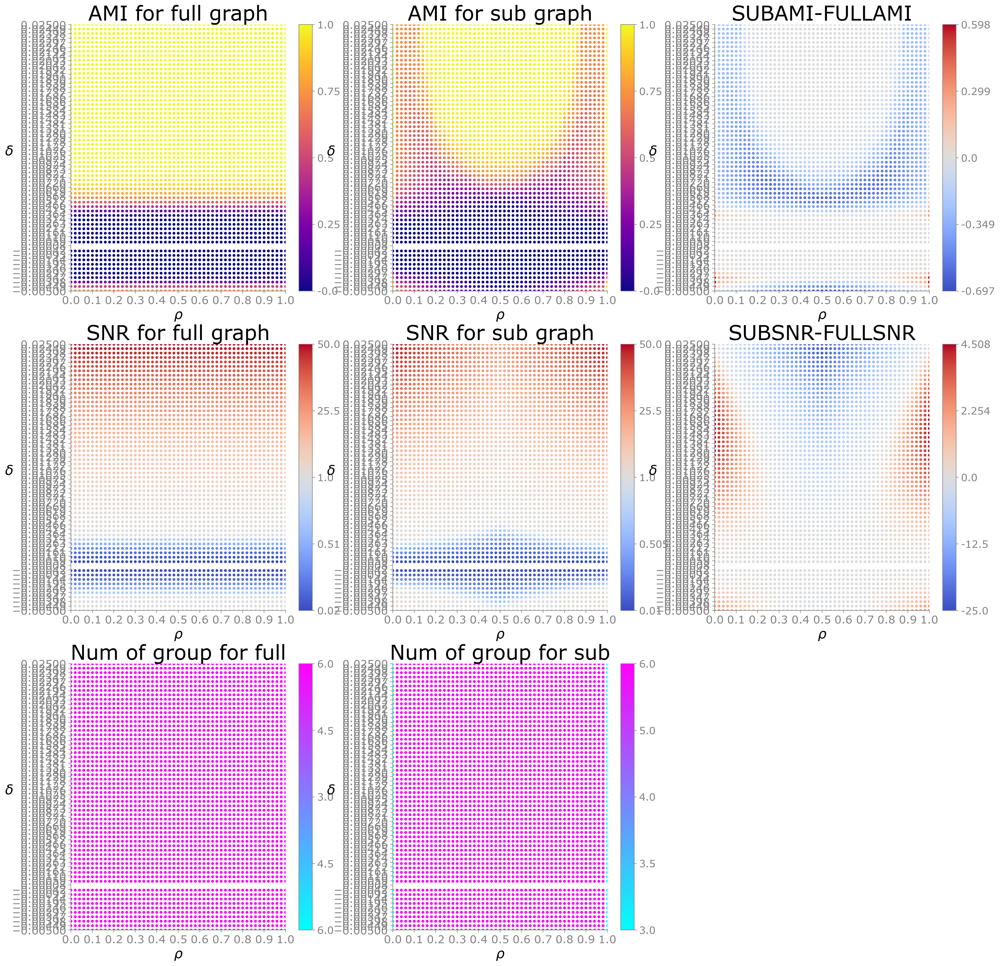

In [22]:
selfplot(plot_rhos, plot_zs, full_ami_givenNumGroup, sub_ami_givenNumGroup, snr_nm, snr_m, full_num_groups_given, sub_num_groups_given)
# save_path = "./_Figure/" + fileId + "GivenNumGroup.png"
# plt.tight_layout()
# plt.savefig(save_path, dpi=600)

In [4]:
def filter_by_rho(rho, plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m):
    print(f'n={n}, group={X*Z}, d={d}, rho={rho}, min delta={np.min(plot_zs)}, max delta={np.max(plot_zs)}')
    index = np.where(plot_rhos == rho)
    deltas = plot_zs[index]
    full_amis = full_ami[index]
    sub_amis =sub_ami[index]
    snr_nms = snr_nm[index]
    snr_ms = snr_m[index]

    fig = plt.figure(figsize=(16, 8))
    widths = [4, 4]
    heights = [4, 4]
    spec5 = fig.add_gridspec(ncols=2, nrows=2, width_ratios=widths, height_ratios=heights)

    row = 1
    col = 0
    ax1 = fig.add_subplot(spec5[row, col])
    plt.plot(deltas, full_amis, label="full_ami")
    plt.plot(deltas, sub_amis, label="sub_ami")
    plt.xlabel(f"delta")
    plt.legend()

    row = 0
    col = 0
    ax = fig.add_subplot(spec5[row, col], sharex=ax1)
    plt.plot(deltas, snr_nms, label="snr_nm")
    plt.plot(deltas, snr_ms, label="snr_m")
    plt.title(f'filter by rho={rho}')
    plt.legend()

    filter_index = np.argwhere(np.logical_and(deltas>=-0.01, deltas<=0.01))
    row = 1
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    plt.plot(deltas[filter_index], full_amis[filter_index], label="full_ami")
    plt.plot(deltas[filter_index], sub_amis[filter_index], label="sub_ami")
    plt.xlabel(f"delta")
    plt.legend()

    row = 0
    col = 1
    ax1 = fig.add_subplot(spec5[row, col], sharex=ax)
    plt.plot(deltas[filter_index], snr_nms[filter_index], label="snr_nm")
    plt.plot(deltas[filter_index], snr_ms[filter_index], label="snr_m")
    plt.title(f'filter by rho={rho}')
    plt.legend()
#     print(snr_nms[filter_index])

In [5]:
def selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group):
    save_path = None
    fig = plt.figure(figsize=(16, 32))
    widths = [8, 8]
    heights = [8, 8, 8, 8]
    spec5 = fig.add_gridspec(ncols=2, nrows=4, width_ratios=widths, height_ratios=heights)
    row = 0
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, snr_nm, z_center=1, title="SNR for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$',  save_path=save_path, ax=ax, fig=fig)
    row = 0
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, full_ami, z_center=0.5, title="AMI for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["plasma"],  save_path=save_path, ax=ax, fig=fig)
    edge_ami_snr(plot_rhos, plot_zs, full_ami, snr_nm, ax)
    
    row = 1
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, title="SNR for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$',  save_path=save_path, ax=ax, fig=fig)
    row = 1
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=0.5, title="AMI for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["plasma"],  save_path=save_path, ax=ax, fig=fig)
    edge_ami_snr(plot_rhos, plot_zs, sub_ami, snr_m, ax)
    
    row = 2
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, snr_m-snr_nm, z_center=0, title="SNR_sub - SNR_full", xlabel=r'$\rho$', ylabel=r'$\delta$',  save_path=save_path, ax=ax, fig=fig)
    row = 2
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, sub_ami-full_ami, z_center=0, title="AMI_sub - AMI_full", xlabel=r'$\rho$', ylabel=r'$\delta$', save_path=save_path, ax=ax, fig=fig)
    
    row = 3
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, full_num_group, z_center=3, title="Num of group for full", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["cool"], save_path=save_path, ax=ax, fig=fig)
    row = 3
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, sub_num_group, z_center=4, title="Num of group for sub", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["cool"], save_path=save_path, ax=ax, fig=fig)

# EXP for n=12000 DC

In [74]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = False
DC = True
fileId = 'amiExp5.25' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_{"givenNumGroup" if givenNumGroup else ""}_{"DC" if DC else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr)
# print(f'min={np.min(full_ami)}, max={np.max(full_ami)}')
# print(f'min delta={np.min(plot_zs)}, max delta={np.max(plot_zs)}')
# save_path = "./_Figure/AMI_fullgraph_d_" + str(d) + ".png"
# save_path = "./_Figure/" + fileId + ".png"
# plt.tight_layout()
# plt.savefig(save_path, dpi=600)

EXP amiExp5.25_n=12000_X=2_Z=3_d=50_snr__DC noGivenNumGroup


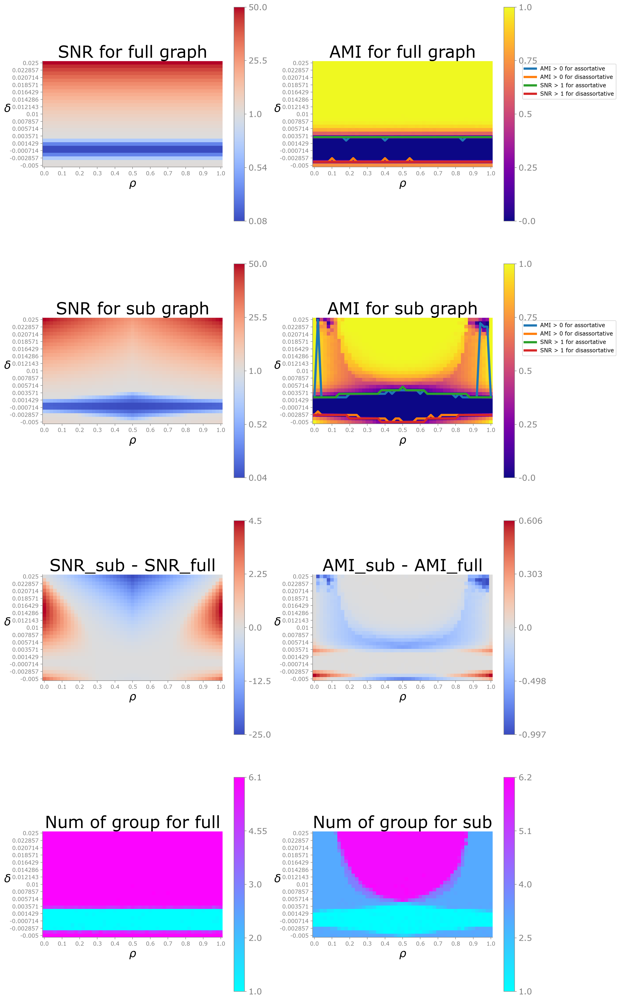

In [75]:
print(f"EXP {fileId} noGivenNumGroup")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)

# EXP for n=12000 \<d\>=50 no DC

In [6]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = True
fileId = 'amiExp5.17' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, full_ami_givenNumGroup, sub_ami_givenNumGroup, full_num_groups_given, sub_num_groups_given = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=True)

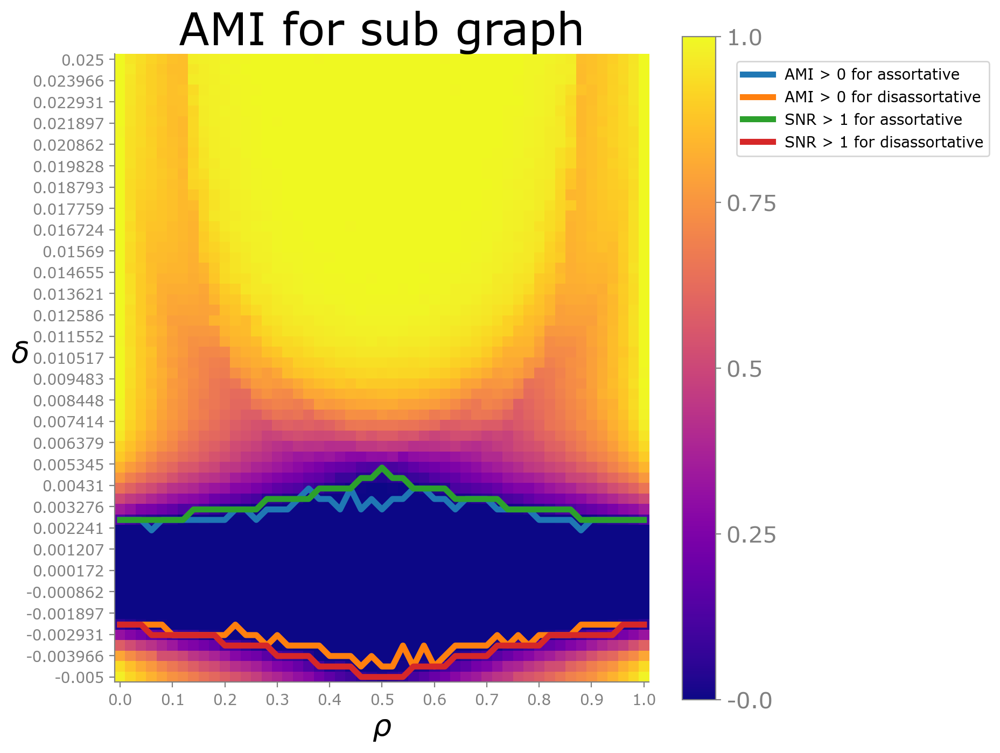

In [55]:
fig = plt.figure(figsize=(8, 8))
widths = [8]
heights = [8]
spec5 = fig.add_gridspec(ncols=1, nrows=1, width_ratios=widths, height_ratios=heights)
row = 0
col = 0
ax = fig.add_subplot(spec5[row, col])
save_path = None
color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=0.5, title="AMI for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["plasma"],  save_path=save_path, ax=ax, fig=fig)
edge_ami_snr(plot_rhos, plot_zs, sub_ami, snr_m, ax)

EXP amiExp5.17_n=12000_X=2_Z=3_d=50_snr noGivenNumGroup


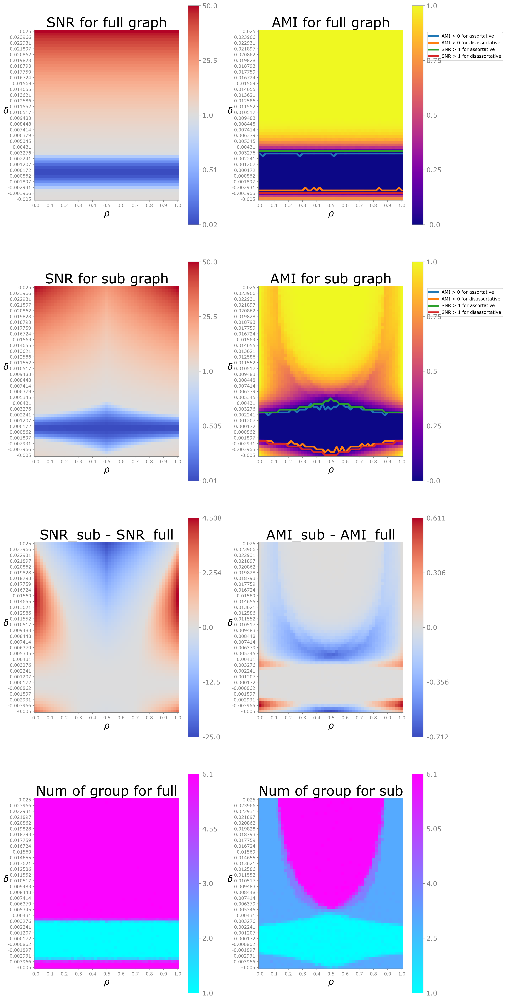

In [7]:
print(f"EXP {fileId} noGivenNumGroup")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)
save_path = "./_Figure/" + fileId + "_noGivenNumGroup.png"
plt.tight_layout()
plt.savefig(save_path, dpi=600)

EXP amiExp5.17_n=12000_X=2_Z=3_d=50_snr GivenNumGroup


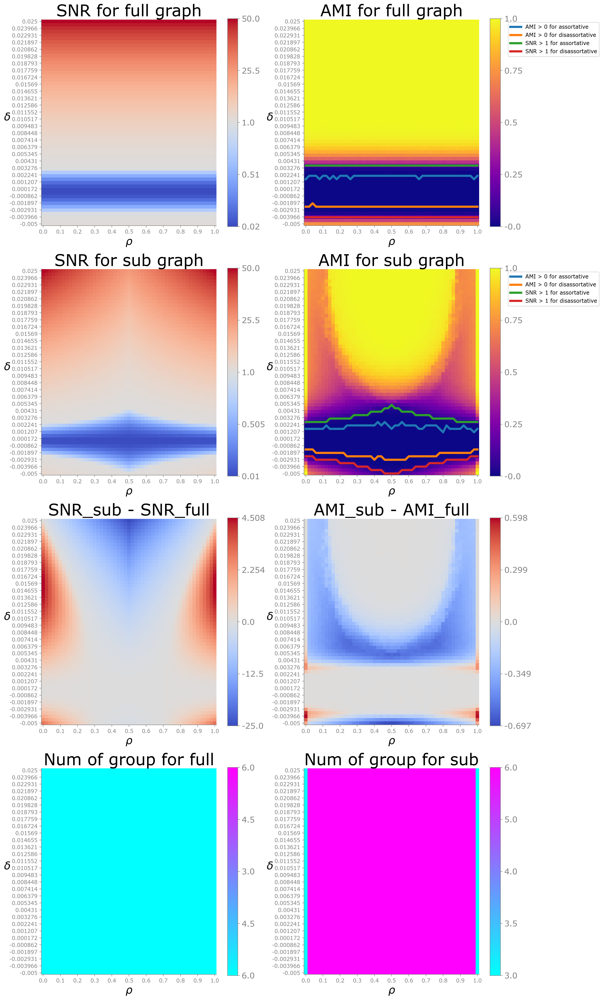

In [73]:
print(f"EXP {fileId} GivenNumGroup")
selfplot(plot_rhos, plot_zs, full_ami_givenNumGroup, sub_ami_givenNumGroup, snr_nm, snr_m, full_num_groups_given, sub_num_groups_given)

# EXP for n=12000 \<d\>=50 no_DC SubDetectHelpedByEigenFromFullgraph

In [8]:
X = 2
Z = 3
n = X*Z*2000  # 12000 nodes
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = True
fileId = 'amiExp6.12' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                        f'{"givenNumGroup" if givenNumGroup else ""}_' \
                        f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr)

EXP amiExp6.12_n=12000_X=2_Z=3_d=50_snr___HelpWithFull


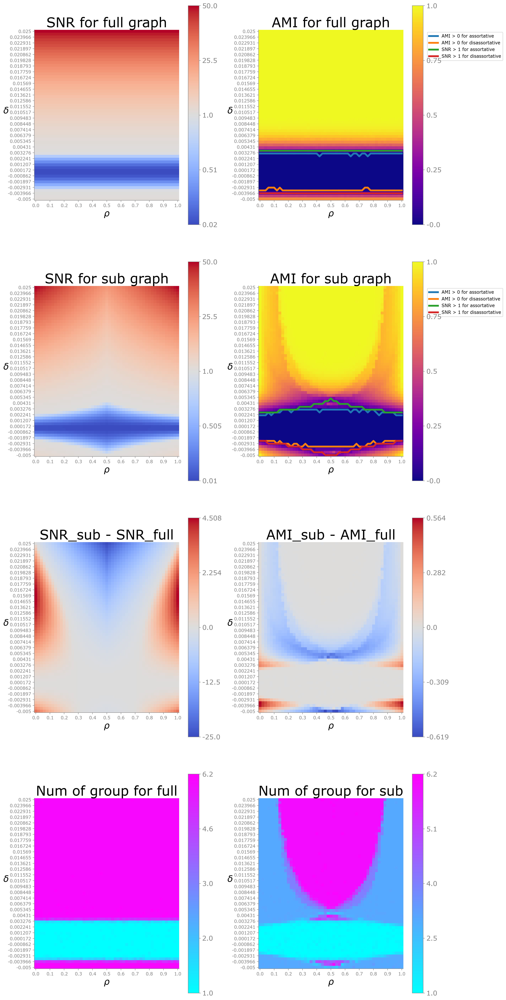

In [9]:
print(f"EXP {fileId}")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)
save_path = "./_Figure/" + fileId + ".png"
plt.tight_layout()
plt.savefig(save_path, dpi=600)

# EXP for n=12000 \<d\>=50 no_DC FullDerivedByLabelPropagateFromSub

In [11]:
X = 2
Z = 3
n = X*Z*2000  # 12000 nodes
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = False
LabelPropagate = True
fileId = 'amiExp6.12' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                        f'{"givenNumGroup" if givenNumGroup else ""}_' \
                        f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' \
                        f'{"LabelPropagate" if LabelPropagate else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr)

EXP amiExp6.12_n=12000_X=2_Z=3_d=50_snr____LabelPropagate SUB in figure mean full detected by label propagate based on subgraph


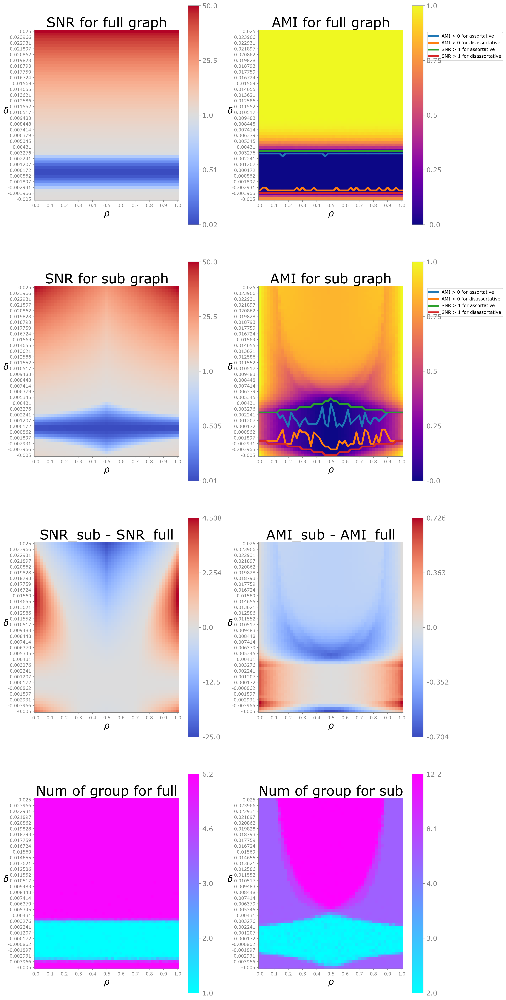

In [12]:
print(f"EXP {fileId} SUB in figure mean full detected by label propagate based on subgraph")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)
save_path = "./_Figure/" + fileId + ".png"
plt.tight_layout()
plt.savefig(save_path, dpi=600)

# EXP for n=12000 \<d\>=50 no_DC FullDerivedByLabelPropagateFromSubHelpWithFull


In [13]:
X = 2
Z = 3
n = X*Z*2000  # 12000 nodes
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = True
LabelPropagate = True
fileId = 'amiExp6.21' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                        f'{"givenNumGroup" if givenNumGroup else ""}_' \
                        f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' \
                        f'{"LabelPropagate" if LabelPropagate else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr)

EXP amiExp6.21_n=12000_X=2_Z=3_d=50_snr___HelpWithFull_LabelPropagate SUB in figure mean full detected by label propagate based on subgraph


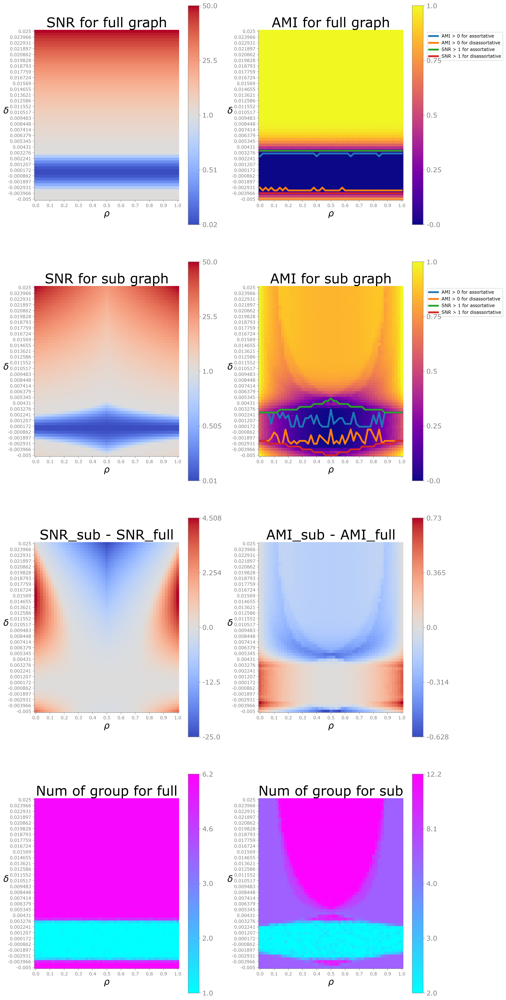

In [14]:
print(f"EXP {fileId} SUB in figure mean full detected by label propagate based on subgraph")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group)
save_path = "./_Figure/" + fileId + ".png"
plt.tight_layout()
plt.savefig(save_path, dpi=600)